In [1]:
import imageio.v3 as imageio
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from tensorflow.keras.models import load_model
import tensorflow as tf
import math
import random

In [2]:
classes=pd.read_csv('class_dict.csv') 
meta=pd.read_csv('metadata.csv')
train_meta_df = meta[meta['split'] == 'train']
test_a_df = meta[meta['split'] == 'nolabela']
test_a_df.reset_index(drop=True, inplace=True)

### TASK 1: Binary terrain classification model testing

Creating a test dataset generator for Binary classification model

In [4]:
class TestDataset(tf.keras.utils.Sequence):
    def __init__(self, meta, batch_size):
        self.meta = meta
        self.batch_size = batch_size
    
    def __len__(self):
        return math.ceil(len(self.meta) / self.batch_size)

    def __getitem__(self, idx):
        start_idx = idx * self.batch_size
        end_idx = min((idx + 1) * self.batch_size, len(self.meta))
        
        batch_x = []
        batch_paths = []  # List to store file paths
        
        for i in range(start_idx, end_idx):
            sat_image_path = self.meta["sat_image_path"][i]
            sat_image = imageio.imread(sat_image_path)
            batch_x.append(sat_image / 255.0)
            batch_paths.append(sat_image_path)  # Store file path
   
        return np.array(batch_x), batch_paths

    def predict(self, model, threshold=0.50):  # Add a threshold argument
        predictions = []
        paths = []
        for idx in range(len(self)):
            batch_x, batch_paths = self.__getitem__(idx)
            batch_predictions = model.predict(batch_x)
            binary_predictions = (batch_predictions > threshold).astype(int)  # Apply threshold
            predictions.extend(binary_predictions)
            paths.extend(batch_paths)
        return np.array(predictions), paths

In [19]:
test_a_dataset = TestDataset(test_a_df, batch_size = 2)
trained_model = load_model('WATERFINAL.keras')
predictions, paths = test_a_dataset.predict(trained_model)

1/1 [==============================] - 1s 509ms/step


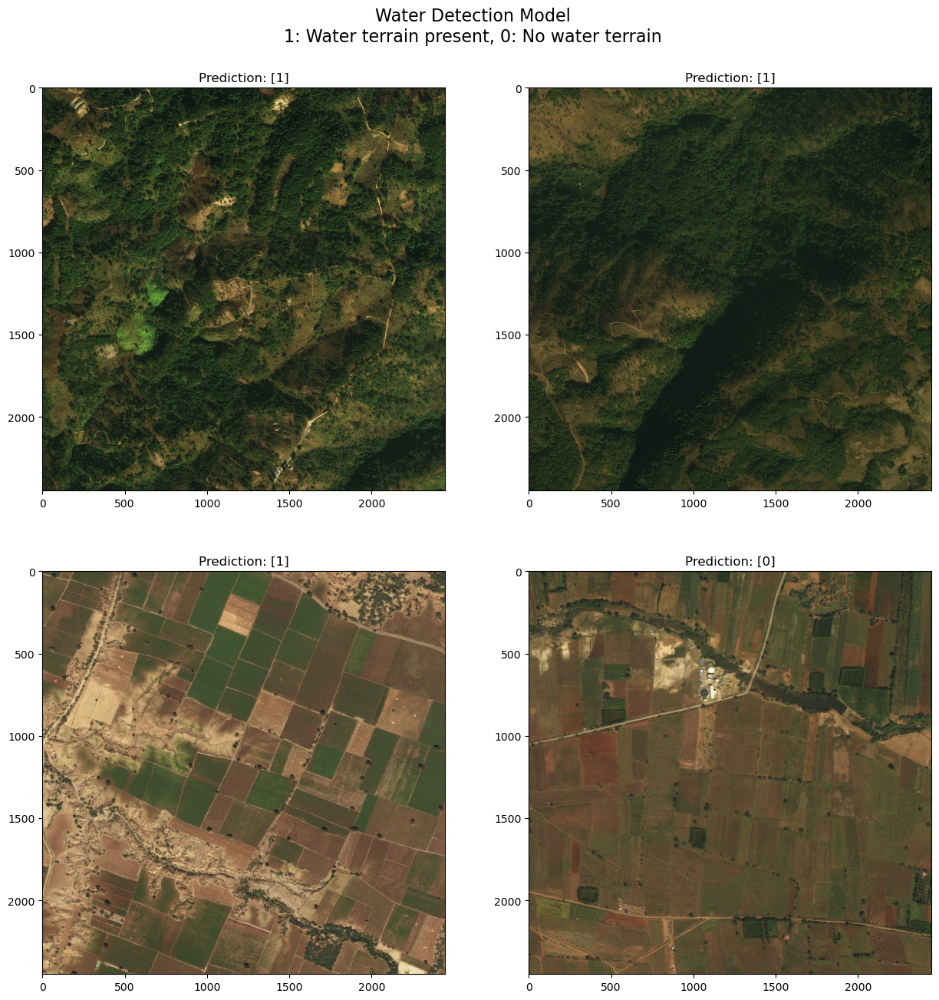

In [33]:
fig, axs = plt.subplots(2, 2, figsize=(15, 15))
random_selection = random.sample(range(len(predictions)), 4)  # Randomly select 4 indices

for j, i in enumerate(random_selection):
    im = imageio.imread(paths[i])
    title = f"Prediction: {predictions[i]}"

    # Determine subplot position
    if j < 2:
        ax = axs[0, j]
    else:
        ax = axs[1, j - 2] 

    # Plot the image
    ax.imshow(im)
    ax.set_title(title)

fig.suptitle("Water Detection Model\n1: Water terrain present, 0: No water terrain", fontsize=16, y=0.95)
plt.show()

1/1 [==============================] - 1s 538ms/step


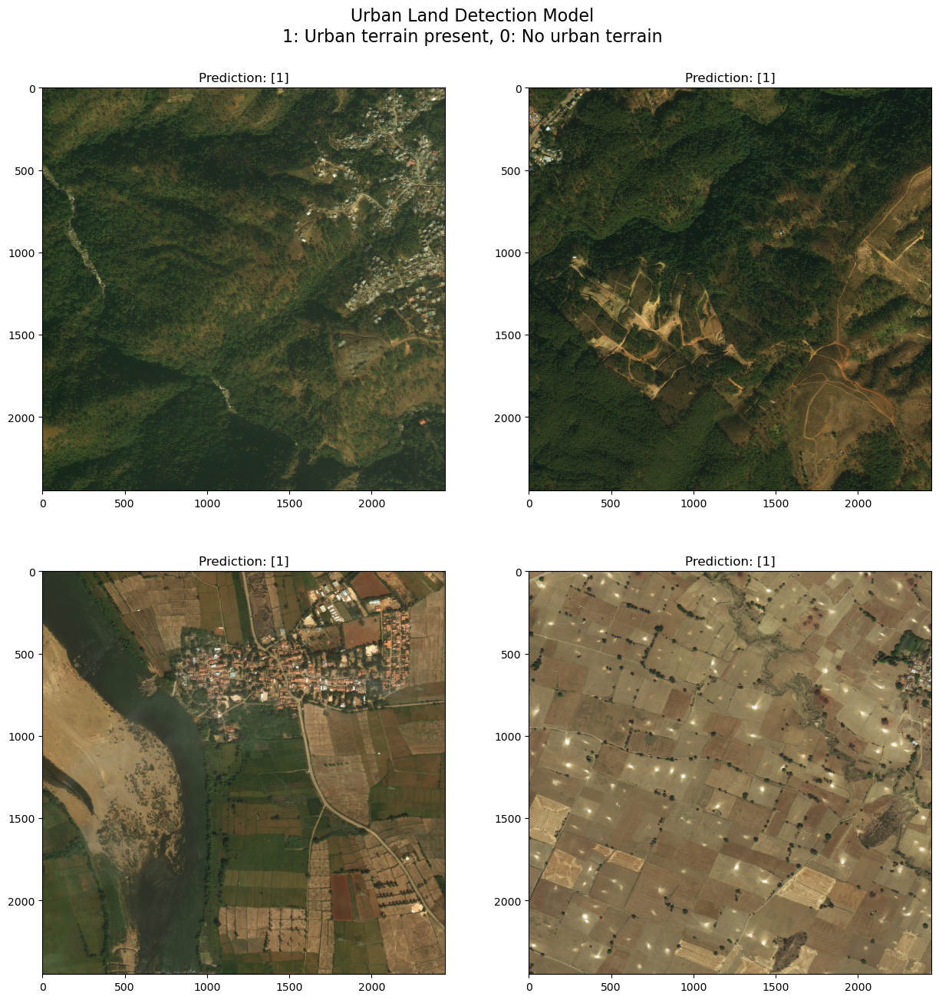

In [8]:
test_a_dataset = TestDataset(test_a_df, batch_size=2)
trained_model = load_model('UrbanFINAL.keras')
predictions, paths = test_a_dataset.predict(trained_model)

fig, axs = plt.subplots(2, 2, figsize=(15, 15))
random_selection = random.sample(range(len(predictions)), 4) 

for j, i in enumerate(random_selection):
    im = imageio.imread(paths[i])
    title = f"Prediction: {predictions[i]}"

    # Determining subplot position
    if j < 2:
        ax = axs[0, j]
    else:
        ax = axs[1, j - 2]


    ax.imshow(im)
    ax.set_title(title)

fig.suptitle("Urban Land Detection Model\n1: Urban terrain present, 0: No urban terrain", fontsize=16, y=0.95)
plt.show()


### TASK 2: Fraction detection model testing

Creating a test dataset generator for fractional detection model

In [34]:
class TestDataset2(tf.keras.utils.Sequence):
    def __init__(self, meta, batch_size):
        self.meta = meta
        self.batch_size = batch_size
    
    def __len__(self):
        return math.ceil(len(self.meta) / self.batch_size)

    def __getitem__(self, idx):
        start_idx = idx * self.batch_size
        end_idx = min((idx + 1) * self.batch_size, len(self.meta))
        
        batch_x = []
        batch_paths = []  # List to store file paths
        
        for i in range(start_idx, end_idx):
            sat_image_path = self.meta["sat_image_path"][i]
            sat_image = imageio.imread(sat_image_path)
            batch_x.append(sat_image / 255.0)
            batch_paths.append(sat_image_path)  # Store file path
   
        return np.array(batch_x), batch_paths

    def predict(self, model):
        predictions = []
        paths = []
        for idx in range(len(self)):
            batch_x, batch_paths = self.__getitem__(idx)
            batch_predictions = model.predict(batch_x)
            predictions.extend(batch_predictions)
            paths.extend(batch_paths)
        return np.array(predictions), paths

In [55]:
test_a_dataset = TestDataset2(test_a_df, batch_size=2)
trained_model = load_model('FRACTION_MODEL_FINAL.keras')

predictions, paths = test_a_dataset.predict(trained_model)

1/1 [==============================] - 1s 508ms/step


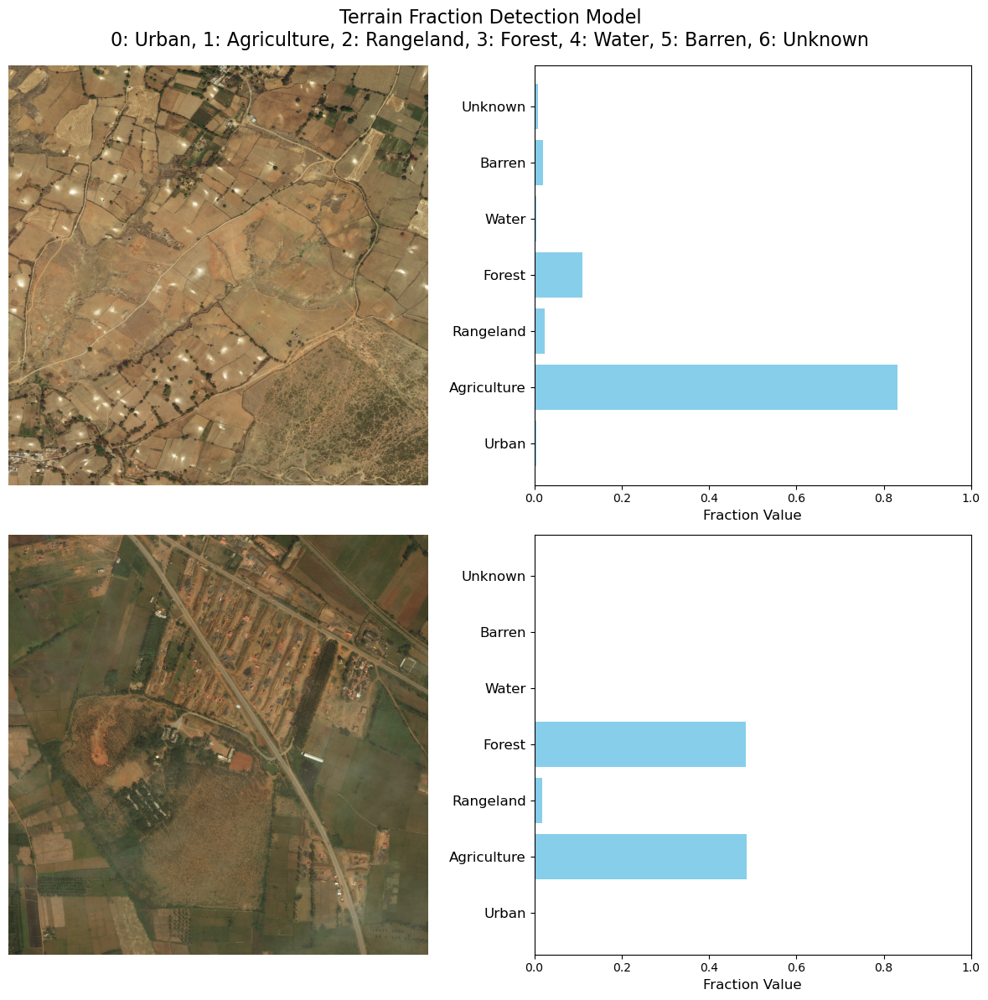

In [75]:
terrain_labels = ["Urban", "Agriculture", "Rangeland", "Forest", "Water", "Barren", "Unknown"]
fig, axs = plt.subplots(2, 2, figsize=(12, 12)) 
fig.subplots_adjust(top=0.9)  
fig.suptitle("Terrain Fraction Detection Model\n0: Urban, 1: Agriculture, 2: Rangeland, 3: Forest, 4: Water, 5: Barren, 6: Unknown", fontsize=16, y=0.99)

for j, idx in enumerate(random.sample(range(len(predictions)), 2)):
    im = imageio.imread(paths[idx])

    # Ploting the image
    ax = axs[j, 0] 
    ax.imshow(im)
    ax.axis('off')
    
    # Plotting the bar chart for the fraction values
    ax = axs[j, 1]  # Select the appropriate subplot
    ax.barh(terrain_labels, predictions[idx], color='skyblue')
    ax.set_xlim(0, 1)  # Set x-axis limit from 0 to 1
    ax.set_xlabel('Fraction Value', fontsize=12)
    ax.tick_params(axis='y', labelsize=12)

plt.tight_layout()
plt.show()

### TASK 3: Mask creation model testing

In [77]:
im=imageio.imread('nolabela\972516_sat.jpg')
trained_model = load_model('Mask_Predict_FINAL.keras')
im_batch = np.expand_dims(im, axis=0)
predictions = trained_model.predict(im_batch / 255.0)

# Geting the terrain type with the highest probability for each pixel
terrain_map = np.argmax(predictions, axis=-1)

1/1 [==============================] - 1s 1s/step


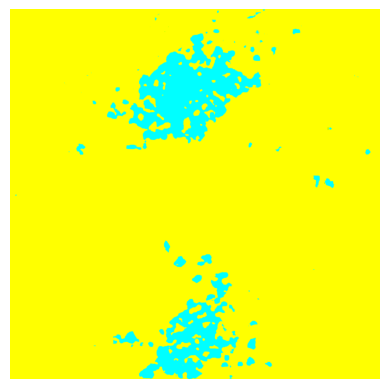

In [78]:
# Defining the RGB values for each terrain type
terrain_colors = {
    0: (0, 255, 255),    # urban_land (cyan)
    1: (255, 255, 0),    # agriculture_land (yellow)
    2: (255, 0, 255),    # rangeland (magenta)
    3: (0, 255, 0),      # forest_land (green)
    4: (0, 0, 255),      # water (blue)
    5: (255, 255, 255),  # barren_land (white)
    6: (0, 0, 0)         # unknown (black)
}

terrain_image = np.zeros((2448, 2448, 3), dtype=np.uint8)
flat_terrain_matrix = terrain_map.flatten()

# Iterating over each terrain value in the flattened matrix
for index, terrain_value in np.ndenumerate(flat_terrain_matrix):
    # Lookup the corresponding RGB color
    color = terrain_colors.get(terrain_value, (255, 255, 255))  # Default to white if terrain_value is not found
    # Converting the flattened index back to 2D coordinates
    i, j = np.unravel_index(index, (2448, 2448))
    # Assigning the color to the corresponding pixel in the RGB image
    terrain_image[i, j] = color


plt.imshow(terrain_image)
plt.axis('off')
plt.show()

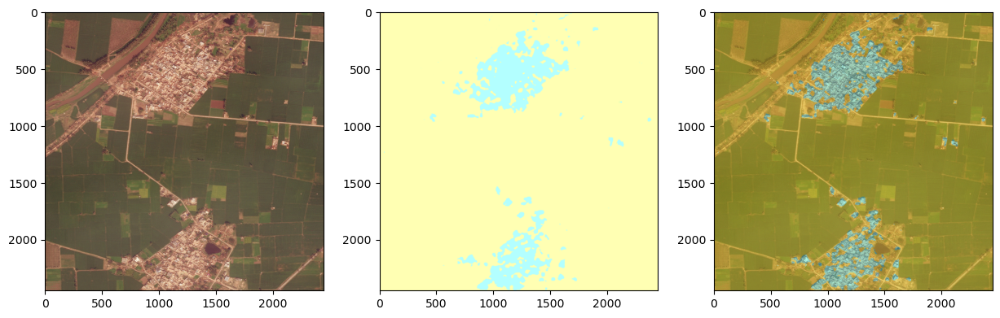

In [79]:
fig,ax = plt.subplots(1,3,figsize=(15, 15))
ax[0].imshow(im)
ax[1].imshow(terrain_image,alpha=0.3)
ax[2].imshow(im)
ax[2].imshow(terrain_image,alpha=0.3)

1/1 [==============================] - 1s 772ms/step


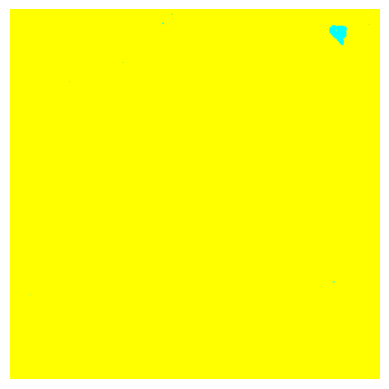

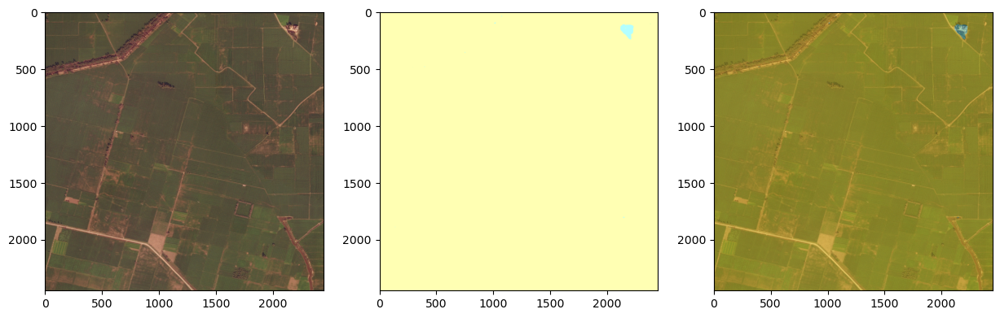

In [80]:
im=imageio.imread('nolabelb/1499_sat.jpg') #Read in the sat image
im_batch = np.expand_dims(im, axis=0)
predictions = trained_model.predict(im_batch / 255.0)
terrain_map = np.argmax(predictions, axis=-1)
terrain_image = np.zeros((2448, 2448, 3), dtype=np.uint8)
flat_terrain_matrix = terrain_map.flatten()

# Iterate over each terrain value in the flattened matrix
for index, terrain_value in np.ndenumerate(flat_terrain_matrix):
    # Lookup the corresponding RGB color
    color = terrain_colors.get(terrain_value, (255, 255, 255)) 
    # Convert the flattened index back to 2D coordinates
    i, j = np.unravel_index(index, (2448, 2448))
    # Assign the color to the corresponding pixel in the RGB image
    terrain_image[i, j] = color

plt.imshow(terrain_image)
plt.axis('off') 
plt.show()

fig,ax = plt.subplots(1,3,figsize=(15, 15))
ax[0].imshow(im)
ax[1].imshow(terrain_image,alpha=0.3)
ax[2].imshow(im)
ax[2].imshow(terrain_image,alpha=0.3)

1/1 [==============================] - 1s 817ms/step


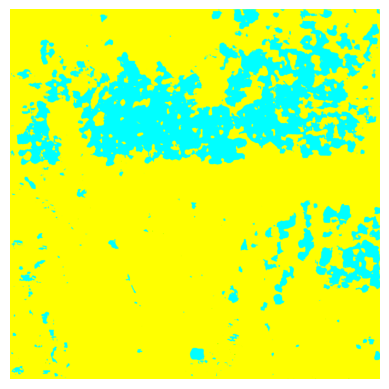

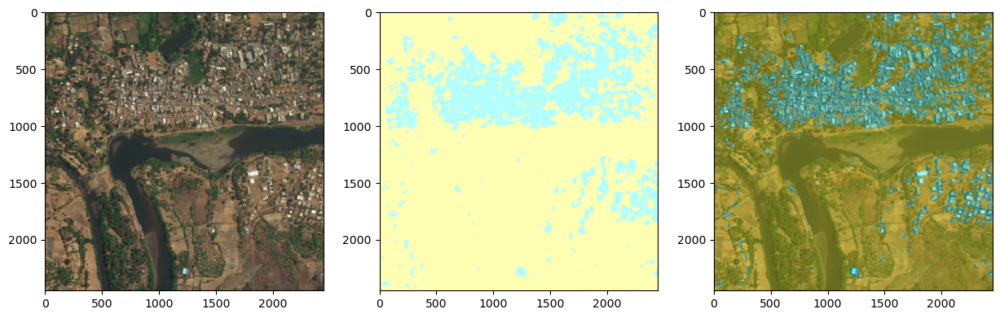

In [82]:
im=imageio.imread('nolabelb/635741_sat.jpg')
im_batch = np.expand_dims(im, axis=0)
predictions = trained_model.predict(im_batch / 255.0)
terrain_map = np.argmax(predictions, axis=-1)
terrain_image = np.zeros((2448, 2448, 3), dtype=np.uint8)
flat_terrain_matrix = terrain_map.flatten()

# Iterate over each terrain value in the flattened matrix
for index, terrain_value in np.ndenumerate(flat_terrain_matrix):
    # Lookup the corresponding RGB color
    color = terrain_colors.get(terrain_value, (255, 255, 255))
    # Convert the flattened index back to 2D coordinates
    i, j = np.unravel_index(index, (2448, 2448))
    # Assign the color to the corresponding pixel in the RGB image
    terrain_image[i, j] = color

plt.imshow(terrain_image)
plt.axis('off') 
plt.show()

fig,ax = plt.subplots(1,3,figsize=(15, 15))
ax[0].imshow(im)
ax[1].imshow(terrain_image,alpha=0.3)
ax[2].imshow(im)
ax[2].imshow(terrain_image,alpha=0.3)

### OPTIONAL TASK

Adding noise values to the images and testing the pixel wise detection model

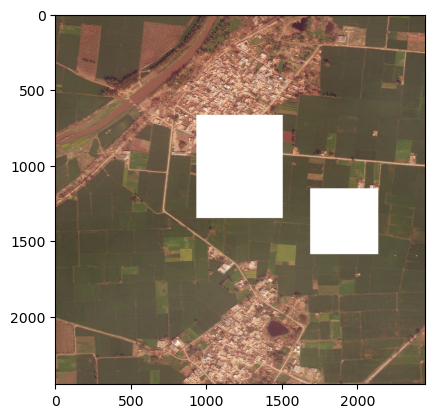

In [24]:
image = imageio.imread('nolabela\972516_sat.jpg')
height, width, _ = image.shape
num_blobs = 2
for _ in range(num_blobs):
    # Defining random shape and position for the blob
    blob_height = np.random.randint(400, 700)  
    blob_width = np.random.randint(400, 700)  
    blob_x = np.random.randint(0, width - blob_width)   # Random x-coordinate within image boundaries
    blob_y = np.random.randint(0, height - blob_height)  # Random y-coordinate within image boundaries

    # Creating a filled white rectangle
    image[blob_y:blob_y+blob_height, blob_x:blob_x+blob_width] = [255, 255, 255]

plt.imshow(image)
plt.show()

1/1 [==============================] - 2s 2s/step


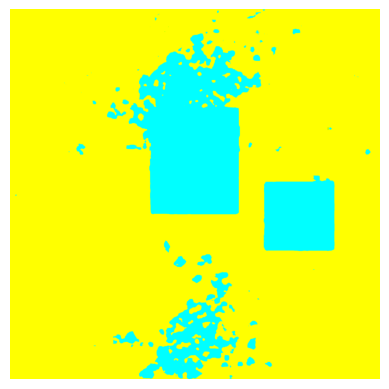

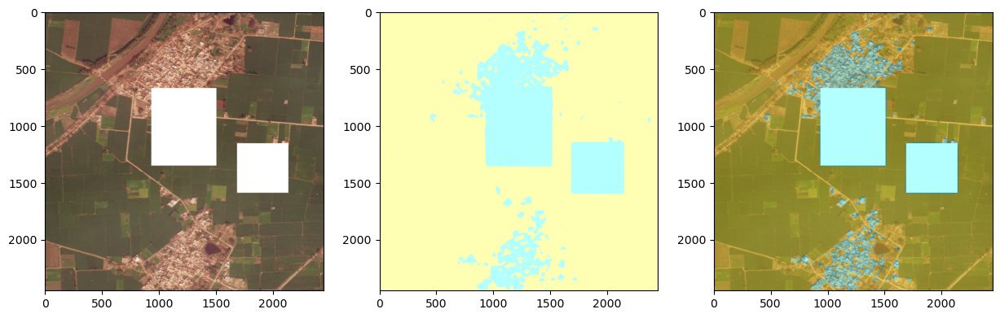

In [26]:
im_batch = np.expand_dims(image, axis=0)
predictions = trained_model.predict(im_batch / 255.0)
terrain_map = np.argmax(predictions, axis=-1)
terrain_image = np.zeros((2448, 2448, 3), dtype=np.uint8)
flat_terrain_matrix = terrain_map.flatten()
trained_model = load_model('Mask_Predict_FINAL.keras')
terrain_colors = {
    0: (0, 255, 255),    # urban_land (cyan)
    1: (255, 255, 0),    # agriculture_land (yellow)
    2: (255, 0, 255),    # rangeland (magenta)
    3: (0, 255, 0),      # forest_land (green)
    4: (0, 0, 255),      # water (blue)
    5: (255, 255, 255),  # barren_land (white)
    6: (0, 0, 0)         # unknown (black)
}
# Iterate over each terrain value in the flattened matrix
for index, terrain_value in np.ndenumerate(flat_terrain_matrix):
    # Lookup the corresponding RGB color
    color = terrain_colors.get(terrain_value, (255, 255, 255))  # Default to white if terrain_value is not found
    # Convert the flattened index back to 2D coordinates
    i, j = np.unravel_index(index, (2448, 2448))
    # Assign the color to the corresponding pixel in the RGB image
    terrain_image[i, j] = color

plt.imshow(terrain_image)
plt.axis('off') 
plt.show()

fig,ax = plt.subplots(1,3,figsize=(15, 15)) 
ax[0].imshow(image)
ax[1].imshow(terrain_image,alpha=0.3) 
ax[2].imshow(image)
ax[2].imshow(terrain_image,alpha=0.3)